<center> <h1> <span style="color:black"> IA|BE Data Science Certificate - Module 2 - Computer lab 4  </h1> </center> 
<center> <h2> <span style="color:red"> Clustering </h1> </center>

# Agenda

* [Chapter 1 - Getting started](#one)
    + [1.1 Libraries](#one-one)
    + [1.2 MNIST Data](#one-two)
    + [1.2 MTPL Data](#one-three)

* [Chapter 2 - K-means clustering](#two)
    + [2.1 First steps](#two-one)
    + [2.2 Mini batch K-Means](#two-two)
    + [2.2 Choosing the number of clusters](#two-two)

* [Chapter 3 - Dimension reduction](#three)
  + [3.1 Introduction](#three-one)
  + [3.2 Principal component analysis (PCA)](#three-two)
  + [3.3 Auto encoders](#three-three)

* [Chapter 4 - Hierarchical clustering](#four)
  + [4.1 Agglomerative clustering](#four-one)

* [Chapter 5 - MTPL Data](#five)
  + [5.1 Data preparation](#five-one)
  + [5.2 PCA](#five-two)
  + [5.3 K-means](#five-three)
  + [5.4 Hierarchical clustering](#five-four)


# Chapter 1 - Getting started <a name="one"></a>

## 1.1 Libraries <a name="one-one"></a>

In [1]:
from matplotlib import pyplot
import numpy as np
import math
import pandas as pd
import plotly.express as px
from keras.datasets import mnist
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.decomposition import PCA
import tensorflow as tf
from sklearn.cluster import AgglomerativeClustering 

## 1.2 MNIST data <a name="one-two"></a>

The MNIST data set is a collection of 60,000 images of handwritten digits. This is a standard data set for demonstrating and comparing the performance of machine learning algorithms working on image data.

In [2]:

(x_train, y_train), (x_test, y_test) = mnist.load_data()

11490434/11490434 [==============================] - 1s 0us/step


In [3]:
x_train[5]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,  13,  25, 100, 122,   7,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

In [4]:
y_train[5]

2

In [5]:
def Plot_mnist(img, title = ""):
    pyplot.axis('off')
    pyplot.imshow(img, cmap=pyplot.get_cmap('gray'))
    pyplot.title(title)



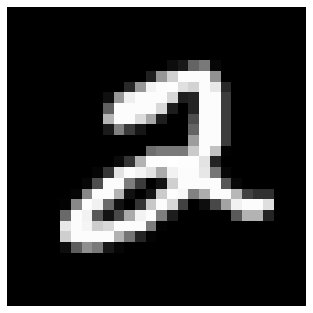

In [6]:
Plot_mnist(x_train[5])

For this session we will treat the images as unlabeled data and investigate whether we can use unsupervised clustering techniques to group them in a small number of clusters. 

There are two main reasons this could be useful:

- We might be interested in getting insight in the variety/groups within the data
- We might want to add these images to a standard machine learning method which uses tabular data (e.g. GLM, GBM, ...). In this case clustering is a first step to reduce the dimension of the original data to a level that can be included in more traditional models.




The clustering algorithms in this sesson work with tabular data. Therefore, we collapse each image into a single row of pixels.

In [7]:
X = x_train.reshape(len(x_train),-1)
Y = y_train

X = X.astype(float) / 255

In [8]:
print(X.shape)

(60000, 784)


## 1.3 MTPL data <a name="one-three"></a>

We will (once again) use the Motor Third Party Liability data set. There are 163,231 policyholders in this data set.

The objective today is **to cluster similar policyholders** based on their characteristics.

Characteristics in the MTPL data set are:
* factor variables, e.g. gender, coverage, fuel
* continuous, numeric variables, e.g. age of the policyholder, age of the car
* spatial information: postal code (in Belgium) of the municipality where the policyholder resides.  

More details in [Henckaerts et al. (2018, Scandinavian Actuarial Journal)](https://katrienantonio.github.io/projects/2019/06/13/machine-learning/#data-driven) and [Henckaerts et al. (2021, NAAJ)](https://arxiv.org/abs/1904.10890).

In [9]:
# load data using separator to correctly parse from .txt
df = pd.read_csv("https://katrienantonio.github.io/hands-on-machine-learning-R-module-1/data/PC_data.txt", sep=r"\s+")

In [10]:
# column names to smaller case
df.columns = map(str.lower, df.columns)

In [11]:
print(df.loc[1])

id                  2
nclaims             0
amount            0.0
avg               NaN
exp               1.0
coverage           PO
fuel         gasoline
use           private
fleet               N
sex            female
ageph              64
bm                  5
agec                3
power              66
pc               1000
town          BRUSSEL
long         4.355223
lat         50.845386
Name: 1, dtype: object


# Chapter 2 - K-means clustering <a name="two"></a>

## 2.1 - First steps <a name="two-one"></a>

We start by clustering the MNIST data set into 10 clusters using K-means

In [12]:
num_cluster = 10

# Initialize the K-means method
km = KMeans(n_clusters = num_cluster, random_state = 1) 

# Apply the K-means method
km.fit(X)

KMeans(n_clusters=10, random_state=1)

Clustering is unsupervised and hence we would normally use these methods when no actual labels are available. However, in the MNIST data set labels, identifying the displayed digit, are available. In this workshop we will use these labels purely to visualize the performance of the model and to see to what extent the found clusters correspond to the different digits.

The auto label function defined below, computes the most common digit within each cluster. We can only define this function because the actual labels `Y` are available.

In [15]:
def Auto_label(fit, actual) :
    result = {}

    for i in range(fit.n_clusters):
        labels = actual[fit.labels_ == i]
        value, counts = np.unique(labels, return_counts=True)
        count = len(labels)
        label = value[np.argmax(counts)]
        percentage = round(sum(labels == label) / count * 100, 1)

        result[i] = "digit " + str(label) + " in " + str(percentage) + "% of the " + str(count) + " images"
    
    return(result)

In [16]:
label = Auto_label(km, Y)
label

{0: 'digit 6 in 85.9% of the 5717 images',
 1: 'digit 7 in 42.7% of the 8835 images',
 2: 'digit 1 in 62.5% of the 5945 images',
 3: 'digit 1 in 52.7% of the 5645 images',
 4: 'digit 3 in 52.8% of the 7435 images',
 5: 'digit 0 in 90.7% of the 3086 images',
 6: 'digit 0 in 79.2% of the 3163 images',
 7: 'digit 8 in 52.4% of the 6575 images',
 8: 'digit 2 in 89.6% of the 4672 images',
 9: 'digit 4 in 35.7% of the 8927 images'}

A few observations:

* Not all clusters are equally common.
* Similarity between the images in the same cluster is high. In most clusters more than half of the images represent the same image. Note again that the digit labels were not used at any stage for training the model and the model clusters don't have to align with the actual digits.
* There are multiple clusters corresponding to the same digit, possibly identifying different writing styles for these digits.



Next, we visualize the cluster centers. These cluster centers are fictitious images obtained by computing the average of all images within a cluster. For this we do not need the actual labeled data, although we will use the labeled data to label each image.

In [17]:
def Visualize_cluster(fit, label) :
    fig, axs = pyplot.subplots(3, 4, figsize = (20, 20))

    for i, ax in enumerate(axs.flat):
        if i < fit.n_clusters:
            ax.set_title(label[i])
            ax.imshow(np.reshape(fit.cluster_centers_[i], (28, 28)), cmap=pyplot.get_cmap('gray'))
            ax.axis('off')
    

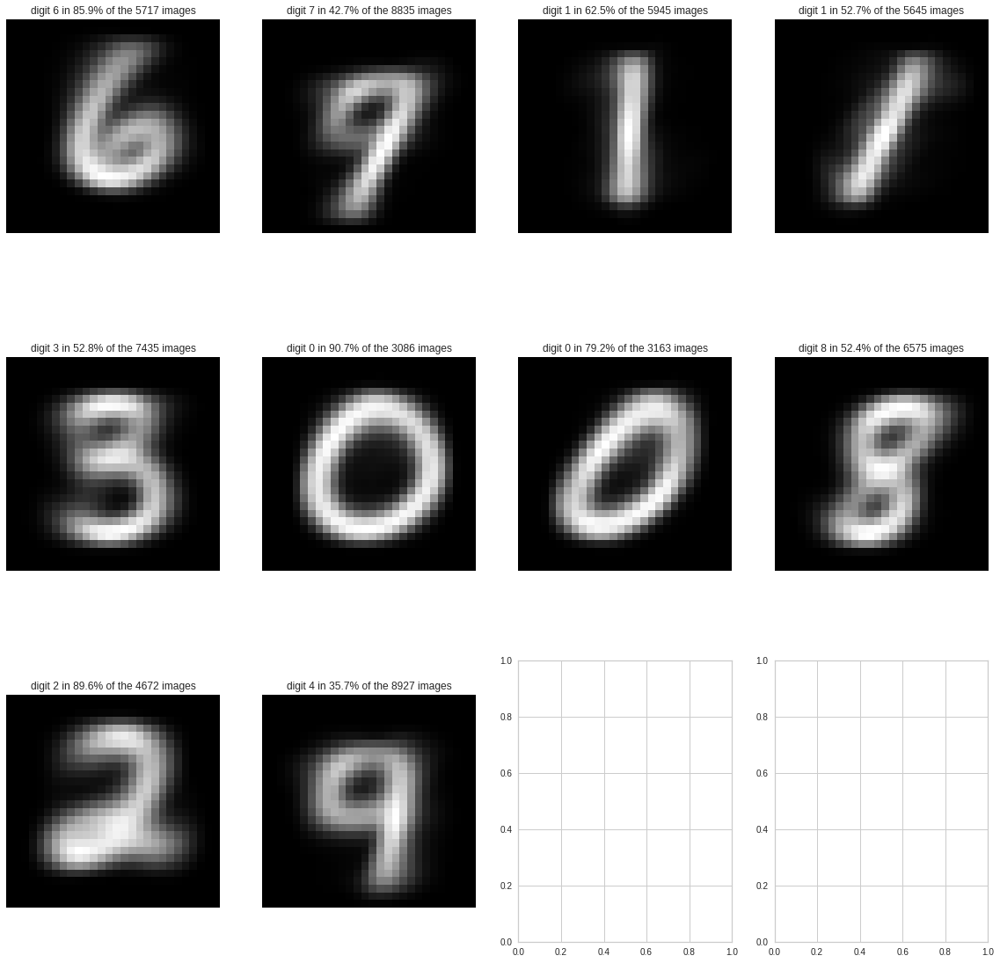

In [18]:
Visualize_cluster(km, label)

## 2.2 - Mini batch K-Means <a name="two-two"></a>

Our first fit of the K-means algorithm took quite a while. Time complexity of K-means increases with both the number of records (60,000) and the number of columns (756). This can be an issue for larger data sets or data sets containing larger images.

Mini batch K-means provides a solution by clustering the data set in multiple steps, while using in each step only a small fraction of the data.

In [21]:
km = MiniBatchKMeans(n_clusters = num_cluster)
km.fit(X)

MiniBatchKMeans(n_clusters=10)

In [22]:
label = Auto_label(km, Y)
label

{0: 'digit 4 in 35.5% of the 5797 images',
 1: 'digit 1 in 50.8% of the 6656 images',
 2: 'digit 3 in 47.2% of the 9430 images',
 3: 'digit 1 in 69.3% of the 4787 images',
 4: 'digit 8 in 32.7% of the 6616 images',
 5: 'digit 6 in 85.2% of the 5467 images',
 6: 'digit 4 in 42.9% of the 6906 images',
 7: 'digit 2 in 89.6% of the 4572 images',
 8: 'digit 7 in 84.8% of the 5042 images',
 9: 'digit 0 in 94.0% of the 4727 images'}

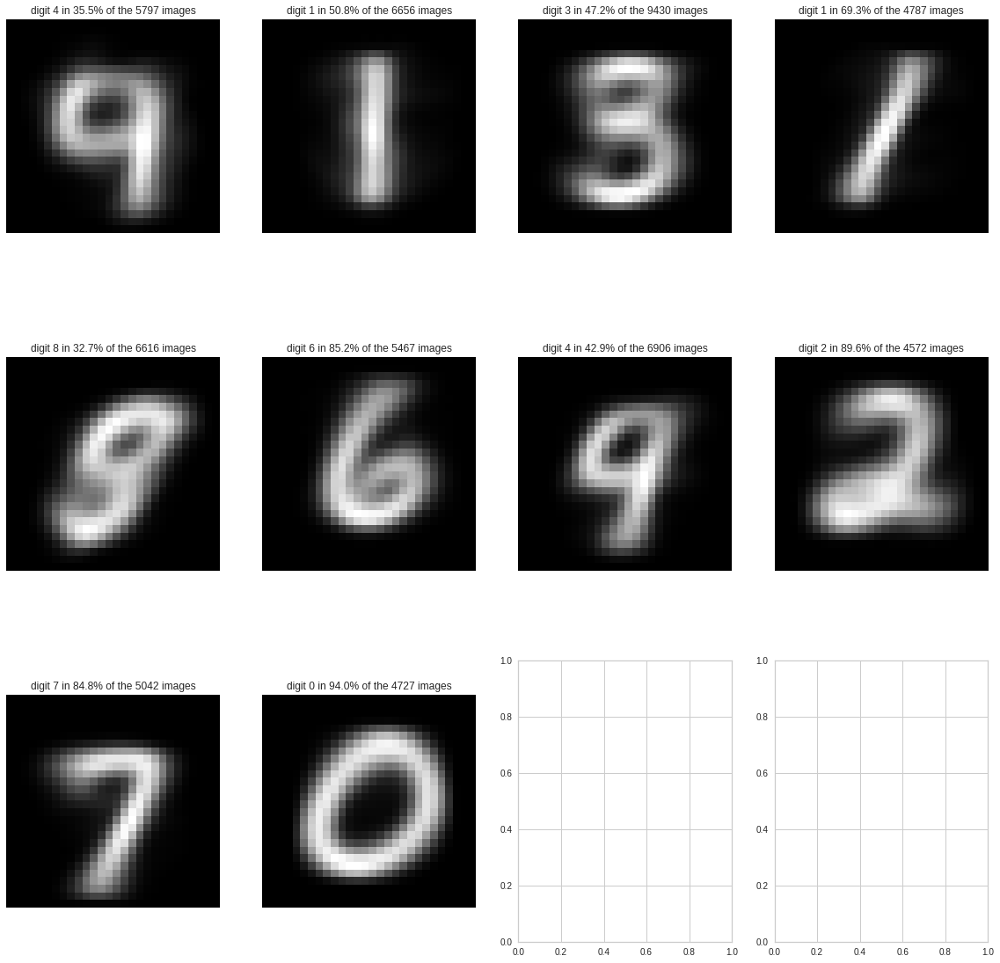

In [23]:
Visualize_cluster(km, label)

For the MNIST data set we observe a significant efficiency gain by using mini batch K-means, while the performance remains the same.

## 2.3 - Choosing the number of clusters <a name="two-three"></a>

The number of clusters is the key parameter in the K-means algorithm. In order to determine this parameter, we need a **performance metric**. The most common performance metric is inertia, which is the sum of the squared distances of each observation to the center of its cluster.

In [24]:
km.inertia_

2367927.021705023

In [25]:
import math;
math.sqrt(km.inertia_ / km.labels_.size)

6.28215332205052

The average distance between an observation and its corresponding cluster is 6.29. 

In this example, we have a ground truth (the actual digit) available. Cluster purity is a popular metric to assess to what extend the KMeans cluster corresponds to that ground truth.


$$Purity = \frac{1}{|\text{observation}|} \cdot \sum_{\text{cluster $i$}} max_{j}(X_{ij}),$$
with $X_{ij}$ the number of elements in cluster $i$ with label $j$

In [29]:
def purity(cluster: list, actual: list) -> float:
  table = pd.DataFrame(
      {
          'cluster': cluster,
          'actual': actual
      }
  )

  frequency_in_highest_bin = (
      table
          .groupby(['cluster', 'actual'])
          .size()
          .reset_index(name = 'count') # compute frequency combination cluster/actual
          .groupby(['cluster'])
          ['count'].max()
          .reset_index(name = 'max_main_cluster') # select highest frequency within each group
          ['max_main_cluster']
          .sum() # sum highest frequencies
  )

  return frequency_in_highest_bin / len(cluster)

In [33]:
purity(km.labels_, Y)

0.5968333333333333

We compute this value for different values of $K$ (i.e. number of clusters) to find the optimal balance between minimizing heterogeneity and looking for simplicity.

In [39]:
inertia = []
cluster_purity = []
avg_error = []
for n in range(1 , 30):
    alg = MiniBatchKMeans(n_clusters = n)
    alg.fit(X)
    inertia.append(alg.inertia_)
    avg_error.append(math.sqrt(alg.inertia_ / alg.labels_.size))
    cluster_purity.append(purity(alg.labels_, Y))

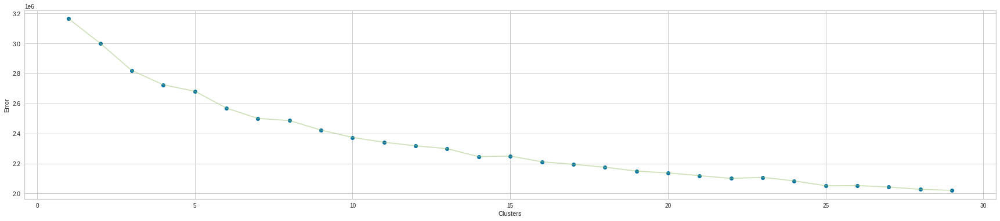

In [44]:
pyplot.figure(1 , figsize = (30 ,6))
pyplot.plot(np.arange(1 , 30) , inertia , 'o')
pyplot.plot(np.arange(1 , 30) , inertia , '-' , alpha = 0.5)
pyplot.xlabel('Clusters') , pyplot.ylabel('Error')
pyplot.show()

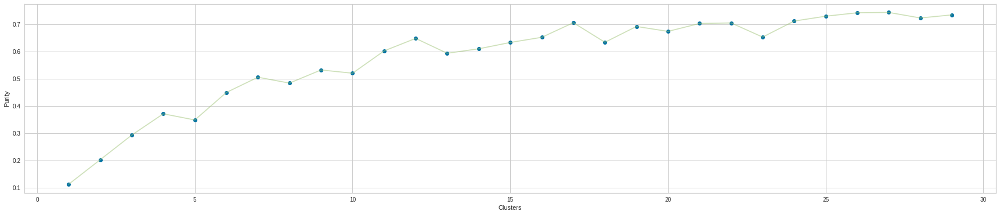

In [42]:
pyplot.figure(1 , figsize = (30 ,6))
pyplot.plot(np.arange(1 , 30) , cluster_purity , 'o')
pyplot.plot(np.arange(1 , 30) , cluster_purity , '-' , alpha = 0.5)
pyplot.xlabel('Clusters') , pyplot.ylabel('Purity')
pyplot.show()

A popular method to choose the value for $K$ based on this figure is to look for the point where the improvement slows down. Based on this figure, seven clusters appears to be a good choice. This method is called the **elbow method**, because the figure looks like an arm and the optimal point is the elbow.

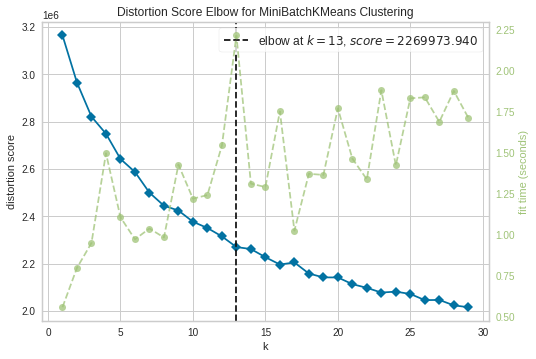

In [28]:
visualizer = KElbowVisualizer(MiniBatchKMeans(), k=(1, 30))
visualizer.fit(X)
visualizer.show()

We now refit the model with the selected ideal number of clusters.

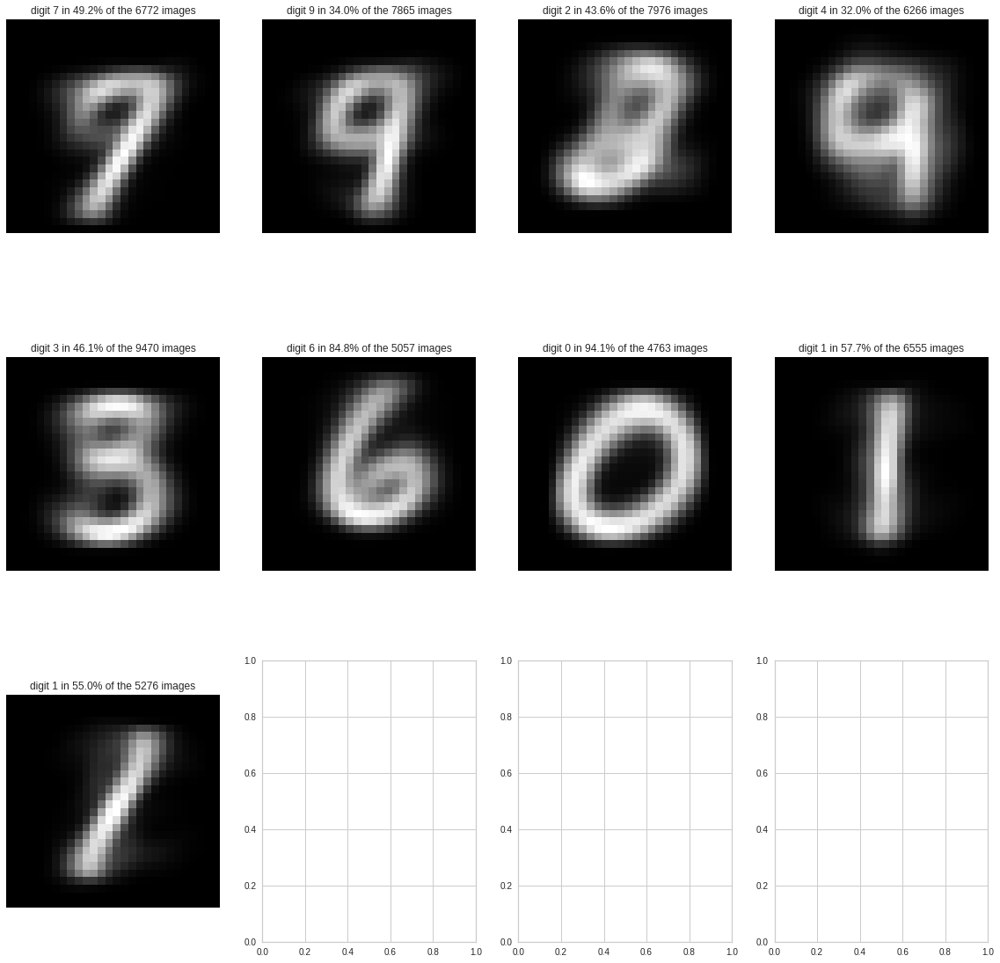

In [45]:
km = MiniBatchKMeans(n_clusters = 9)
km.fit(X)
label = Auto_label(km, Y)
Visualize_cluster(km, label)

# Chapter 3 - Dimension reduction <a name="three"></a>

## 3.1 - Introduction <a name="three-one"></a>

Currently each pixel in the image is coded with a gray value leading to 756 = 28 x 28 features per image. The number of features increases rapidly (quadratic) with the size of the image. This poses severe computational problems for statistical models for clustering and makes it difficult to interpret their results.

Dimension reduction techniques provide an answer to these challenges by embedding the image in a lower dimensional space. Such methods represent each image with less features, while preserving a much as possible the variability encountered in the original data.

## 3.2 - Principal component analysis (PCA) <a name="three-two"></a>

We start by constructing as many principal components as there are columns in our data set. In the second step we will then remove unnecessary components to retain a sparse data set.

In [46]:
pca_all = PCA(n_components=784).fit(X)

The figure below shows on the x-axis the number of retained PCA components and on the y-axis the explained variation in the data. The goal is to find a balance between selecting few features and explaining a large proportion of the variation in the original data.

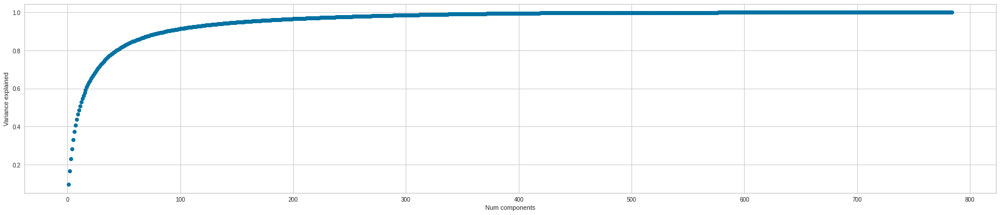

In [47]:
pyplot.figure(1 , figsize = (30 ,6))
pyplot.plot(np.arange(1 , pca_all.n_features_in_+1) , np.cumsum(pca_all.explained_variance_ratio_) , 'o')
pyplot.xlabel('Num components') , pyplot.ylabel('Variance explained')
pyplot.show()

With only 10 components we explain approximately 50% of the variation between the figures. With slightly more than 50 components we capture 80% of the heterogeneity. The last 300 components have little explanatory value.

The number of components chosen to proceed depends on the next steps in the data science pipeline. For inference we typically want a very small set of components (less than 20), for clustering dimension reduction is mainly used to reduce computation time and 50 or 100 components is still acceptable.

In this workshop we choose the number of components such that 80% of the variation is explained.

Both integer and floating point values can be given to the `n_components` argument in `PCA`:

* When `n_components < 1`, the method interprets this as the portion of the variance that has to be explained
* Otherwise `n_components` specifies the exact number of components retained by `PCA`.

In [48]:
# explain 80% of the variation
pca = PCA(n_components = 0.8).fit(X)

In [49]:
# Apply the transformation to the data
X_pca = pca.transform(X)

In a second step we can now use these features as input for statistical models or clustering algorithms. We once again apply K-means.

In [50]:
km_pca = KMeans(n_clusters = 10).fit(X_pca)
label = Auto_label(km_pca, Y)
label

{0: 'digit 0 in 94.1% of the 4985 images',
 1: 'digit 1 in 67.1% of the 5554 images',
 2: 'digit 9 in 34.4% of the 7177 images',
 3: 'digit 1 in 55.8% of the 5320 images',
 4: 'digit 7 in 42.5% of the 6905 images',
 5: 'digit 3 in 50.3% of the 7744 images',
 6: 'digit 4 in 40.1% of the 5310 images',
 7: 'digit 8 in 45.0% of the 6966 images',
 8: 'digit 6 in 84.5% of the 5398 images',
 9: 'digit 2 in 90.3% of the 4641 images'}

In [53]:
purity(km_pca.labels_, Y)

0.5782

The cluster centers found by the K-means algorithm are now also expressed in the low dimensional space. We can convert these centers again to interpretable images by applying the inverse PCA transform.

In [54]:
def Visualize_cluster_km_pca(fit, label, pca) :
    fig, axs = pyplot.subplots(3, 4, figsize = (20, 20))

    for i, ax in enumerate(axs.flat):
        if i < fit.n_clusters:
            ax.set_title(label[i])
            ax.imshow(np.reshape(pca.inverse_transform(fit.cluster_centers_[i]), (28, 28)), cmap=pyplot.get_cmap('gray'))
            ax.axis('off')

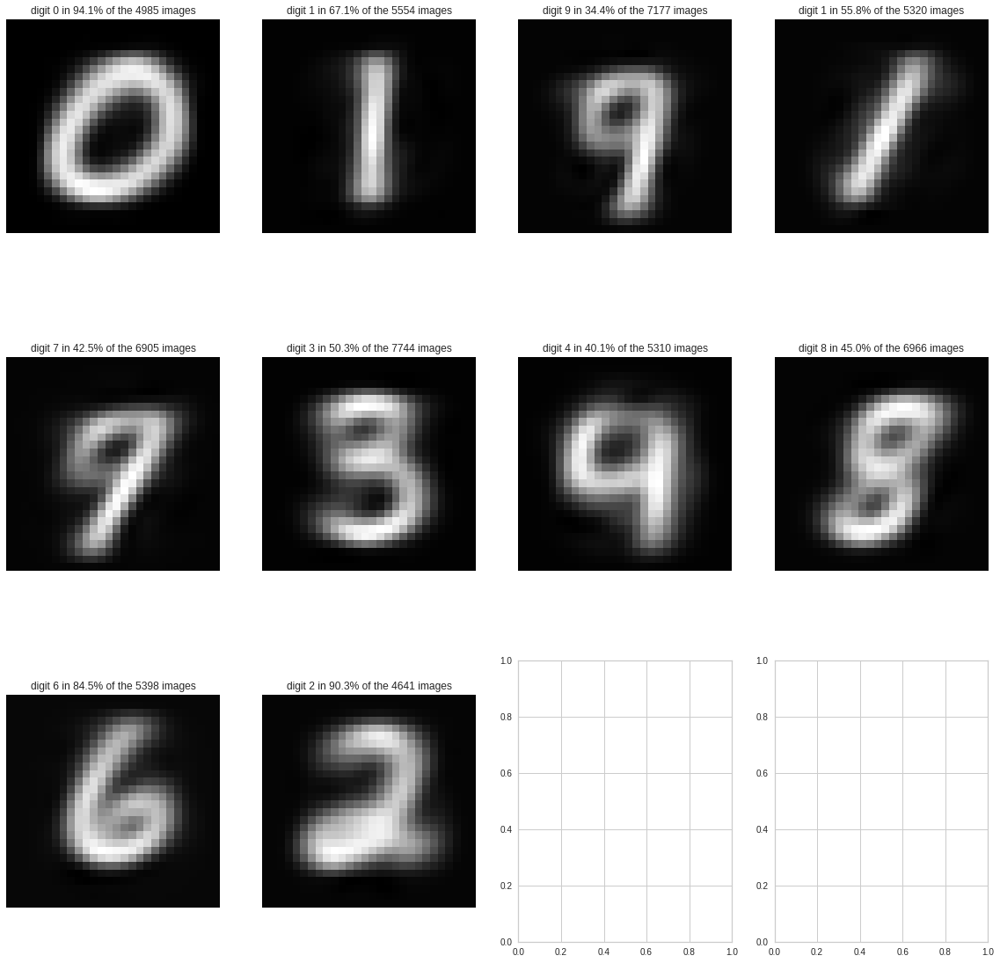

In [55]:
Visualize_cluster_km_pca(km_pca, label, pca)

Cluster performance is similar as before when we applied K-means directly to the original data. The main advantage of first applying PCA is that we reduce computation time by applying the clustering algorithm to a smaller feature space. This performance gain further increases when the images become larger.

## 3.3 - Auto encoders <a name="three-three"></a>

Auto encoders compress the data into a low dimensional space from which it can be uncompressed with minimal information loss.

A neural network is fitted containing both the compression (encoding) and decompression (decoding) step. Concretely, the neural network contains at least the following three layers:

- input layer
- bottleneck layer
- output layer

The input and output layer are the same, implying that at the end of the algorithm (encoding + decoding) the data hasn't changed too much. In between the data is passed through a bottleneck layer with a low number of nodes. The neural network has to choose the nodes which give the best chance of retrieving the input value again in the output layer.


We will fit a neural network, with 3 nodes in the bottleneck layer. There are no hidden layers between the input and bottleneck layer. 

* Auto encoder = input -> bottleneck -> output
* encoder = input -> bottleneck
* decoder = bottleneck -> output

In [56]:
encoding_dimension = 20

input_encoder = tf.keras.layers.Input(shape = (784,))
encoded = tf.keras.layers.Dense(encoding_dimension, activation='relu')(input_encoder)
decoded = tf.keras.layers.Dense(784, activation='sigmoid')(encoded)

autoencoder = tf.keras.models.Model(inputs = input_encoder, outputs = decoded)

In [57]:
encoder = tf.keras.models.Model(input_encoder, encoded)

In [58]:
input_decoder = tf.keras.layers.Input(shape = (encoding_dimension,))
decoder_layer = autoencoder.layers[-1](input_decoder)
decoder = tf.keras.models.Model(input_decoder, decoder_layer)

Compile and fit the auto encoder. Notice that the the input `x` and the output `y` are the same.

In [59]:
autoencoder.compile(optimizer = 'RMSprop', loss = 'mse')
autoencoder.fit(x = X,
                y = X,
                epochs = 30,
                batch_size = 1024,
                validation_split = 0)

Epoch 1/30
59/59 [==============================] - 2s 19ms/step - loss: 0.1026
Epoch 2/30
59/59 [==============================] - 1s 20ms/step - loss: 0.0592
Epoch 3/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0443
Epoch 4/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0362
Epoch 5/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0316
Epoch 6/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0286
Epoch 7/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0265
Epoch 8/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0250
Epoch 9/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0239
Epoch 10/30
59/59 [==============================] - 1s 19ms/step - loss: 0.0231
Epoch 11/30
59/59 [==============================] - 1s 25ms/step - loss: 0.0225
Epoch 12/30
59/59 [==============================] - 2s 26ms/step - loss: 0.0220
Epoch 13/30
59/59 [==================

We compress an image by applying the encoder (first part of the auto encoder) to it

In [60]:
X_nn = encoder.predict(X)
X_nn.shape

1875/1875 [==============================] - 3s 1ms/step


(60000, 20)

We check the performance of the auto encoder by decoding these features again and comparing the original and decoded image

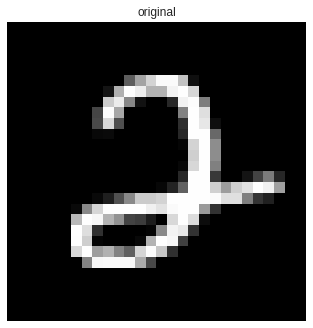

In [61]:
index = 16
Plot_mnist(np.reshape(X[index,:], (28, 28)), title = 'original')

1875/1875 [==============================] - 3s 2ms/step


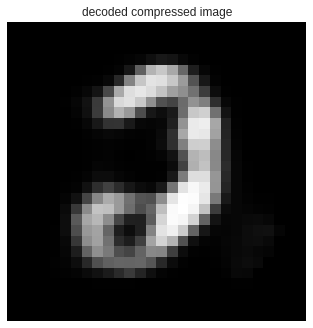

In [62]:
Plot_mnist(np.reshape(decoder.predict(X_nn)[index,:], (28, 28)), title = 'decoded compressed image')

We now cluster the reduced data using K-means. We do this to further reduce the dimension of the retained data and assign interpretable labels for our data.

In [63]:
km_nn = KMeans(n_clusters = 10).fit(X_nn)

In [64]:
label = Auto_label(km_nn, Y)
label

{0: 'digit 2 in 80.8% of the 4084 images',
 1: 'digit 4 in 33.5% of the 7110 images',
 2: 'digit 3 in 52.7% of the 5640 images',
 3: 'digit 6 in 85.6% of the 4543 images',
 4: 'digit 1 in 42.0% of the 12267 images',
 5: 'digit 8 in 44.5% of the 5569 images',
 6: 'digit 0 in 43.6% of the 3335 images',
 7: 'digit 8 in 22.0% of the 7760 images',
 8: 'digit 7 in 51.4% of the 6224 images',
 9: 'digit 0 in 92.8% of the 3468 images'}

In [67]:
purity(km_nn.labels_, Y)

0.49596666666666667

In [65]:
# To visualize the cluster centers we have to apply the fitted decoder

def Visualize_cluster_km_nn(fit, label, decoder) :
    fig, axs = pyplot.subplots(3, 4, figsize = (20, 20))

    for i, ax in enumerate(axs.flat):
        if i < fit.n_clusters:
            ax.set_title(label[i])
            ax.imshow(np.reshape(decoder.predict(
                np.reshape(fit.cluster_centers_[i], (1, encoding_dimension))), (28, 28)), cmap=pyplot.get_cmap('gray'))
            ax.axis('off')

1/1 [==============================] - 0s 20ms/step


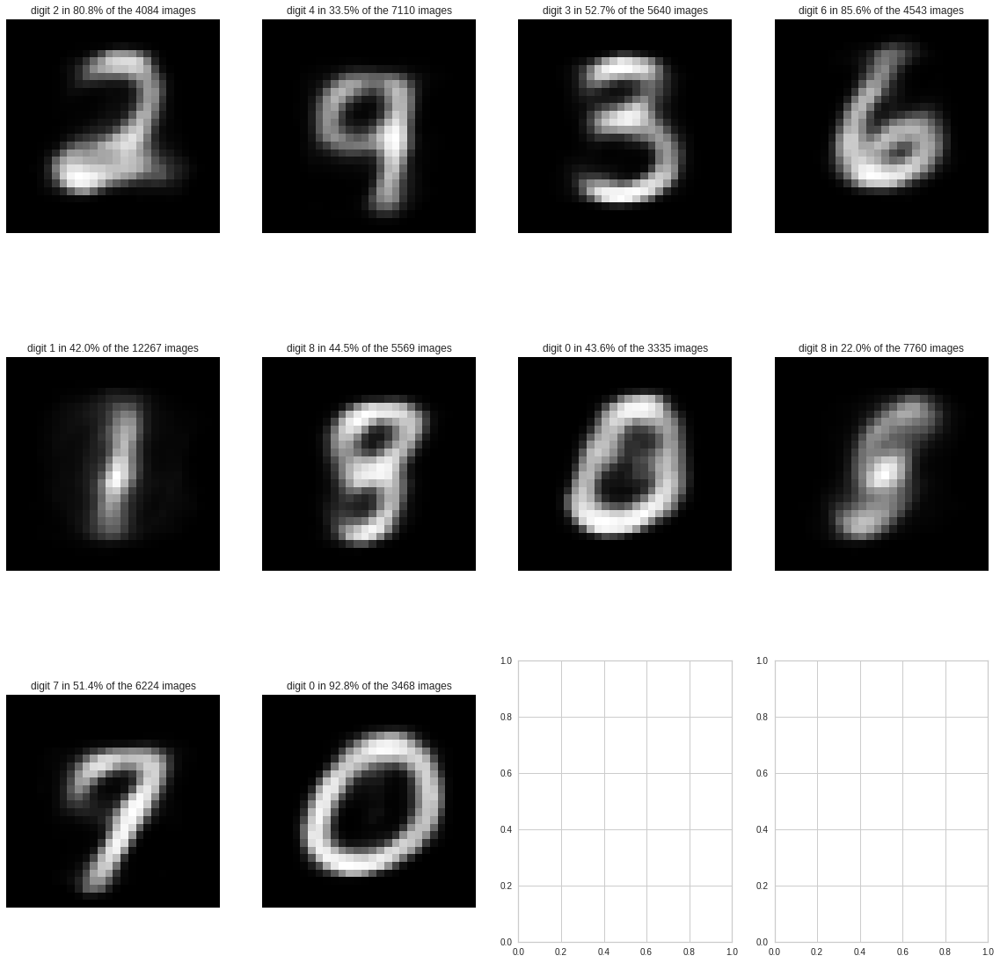

In [66]:
Visualize_cluster_km_nn(km_nn, label, decoder)

Clustering worked well and same digits are often clustered together. One thing to be careful about is that the neural network used to create the encoded data is a non-linear algorithm. Therefore taking the mean of encoded values might sometimes provide strange results.

# Chapter 4 - Hierarchical clustering  <a name="four"></a>

Within the literature on hierarchical clustering methods, two strands can be identified:

* **agglomerative**: each observation starts in its own cluster and similar observations are grouped
* **divisive**: all observations start in a single cluster and this cluster is broken down in smaller parts (similar to a regression tree).

We discuss agglomerative clustering which is by far the most popular method.

## 4.1 - Agglomerative clustering  <a name="four-one"></a>

Agglomerative clustering takes two arguments:

* `n_clusters`: the number of clusters in the end result
* `linkage`: method for computing the distance between two clusters.

Popular linkage methods include:

* `single`: minimal distance between two elements 
* `average`: average distance between two elements
* `complete`: maximal distance between two elements.

As hierarchical clustering of the MNIST data set requires more memory than is available on the default Google Colab instance, we demonstrate the method on a subset of our data set.

In [68]:
sample = np.random.choice(X_pca.shape[0], size=int(0.3*X_pca.shape[0]), replace=False)

In [69]:
agglom = AgglomerativeClustering(n_clusters=10, linkage='average').fit(X_pca[sample, :])

In [ ]:
Auto_label(agglom, Y[sample])

{0: 'digit 1 in 12.5% of the 16000 images',
 1: 'digit 0 in 94.8% of the 1867 images',
 2: 'digit 5 in 32.1% of the 28 images',
 3: 'digit 6 in 57.1% of the 14 images',
 4: 'digit 8 in 44.1% of the 34 images',
 5: 'digit 2 in 50.0% of the 2 images',
 6: 'digit 9 in 52.9% of the 17 images',
 7: 'digit 0 in 61.5% of the 13 images',
 8: 'digit 3 in 68.2% of the 22 images',
 9: 'digit 6 in 100.0% of the 3 images'}

Big difference with K-means, in agglomerative clustering it is common to have small clusters. These correspond to a few, but similar outliers.

Let's look at some images from one of these clusters with few observations

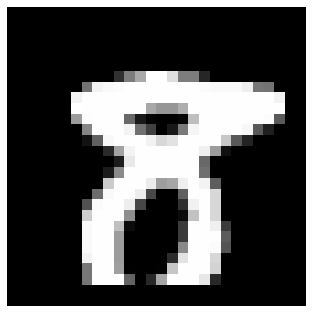

In [72]:
idx_cluster3 = sample[agglom.labels_ == 9]
Plot_mnist(x_train[idx_cluster3[0],:])

There are a few very big clusters, let's increase the number of clusters to break those further down. 

In [73]:
agglom = AgglomerativeClustering(n_clusters=20, linkage='average').fit(X_pca[sample, :])

In [74]:
Auto_label(agglom, Y[sample])

{0: 'digit 1 in 15.5% of the 12749 images',
 1: 'digit 0 in 84.4% of the 32 images',
 2: 'digit 8 in 62.7% of the 75 images',
 3: 'digit 2 in 68.8% of the 16 images',
 4: 'digit 0 in 99.0% of the 1085 images',
 5: 'digit 8 in 60.0% of the 30 images',
 6: 'digit 2 in 96.3% of the 1366 images',
 7: 'digit 0 in 98.1% of the 618 images',
 8: 'digit 3 in 64.2% of the 1797 images',
 9: 'digit 5 in 50.0% of the 2 images',
 10: 'digit 6 in 52.8% of the 36 images',
 11: 'digit 3 in 57.1% of the 7 images',
 12: 'digit 5 in 48.7% of the 39 images',
 13: 'digit 8 in 100.0% of the 1 images',
 14: 'digit 7 in 61.8% of the 34 images',
 15: 'digit 3 in 65.7% of the 35 images',
 16: 'digit 8 in 70.4% of the 27 images',
 17: 'digit 5 in 34.4% of the 32 images',
 18: 'digit 4 in 76.5% of the 17 images',
 19: 'digit 3 in 50.0% of the 2 images'}

In this case study we are not so much interested in finding outliers and are more focused on identifying homogeneous clusters. We can try various linkage parameters in agglomerative clustering and see whether they arrive at a better result.

In [75]:
agglom_single = AgglomerativeClustering(n_clusters=20, linkage='single').fit(X_pca[sample, :])
Auto_label(agglom_single, Y[sample])

{0: 'digit 1 in 11.0% of the 17981 images',
 1: 'digit 8 in 100.0% of the 1 images',
 2: 'digit 9 in 100.0% of the 1 images',
 3: 'digit 8 in 100.0% of the 1 images',
 4: 'digit 0 in 100.0% of the 1 images',
 5: 'digit 5 in 100.0% of the 1 images',
 6: 'digit 8 in 100.0% of the 1 images',
 7: 'digit 8 in 100.0% of the 1 images',
 8: 'digit 0 in 100.0% of the 1 images',
 9: 'digit 6 in 100.0% of the 1 images',
 10: 'digit 3 in 100.0% of the 1 images',
 11: 'digit 0 in 100.0% of the 1 images',
 12: 'digit 0 in 100.0% of the 1 images',
 13: 'digit 8 in 100.0% of the 1 images',
 14: 'digit 5 in 100.0% of the 1 images',
 15: 'digit 9 in 100.0% of the 1 images',
 16: 'digit 8 in 100.0% of the 1 images',
 17: 'digit 3 in 100.0% of the 1 images',
 18: 'digit 9 in 100.0% of the 1 images',
 19: 'digit 9 in 100.0% of the 1 images'}

In [76]:
agglom_single = AgglomerativeClustering(n_clusters=20, linkage='complete').fit(X_pca[sample, :])
Auto_label(agglom_single, Y[sample])

{0: 'digit 5 in 35.9% of the 1542 images',
 1: 'digit 7 in 34.2% of the 2264 images',
 2: 'digit 1 in 41.7% of the 1663 images',
 3: 'digit 0 in 98.1% of the 526 images',
 4: 'digit 2 in 95.2% of the 311 images',
 5: 'digit 2 in 97.7% of the 555 images',
 6: 'digit 4 in 36.6% of the 2261 images',
 7: 'digit 0 in 68.5% of the 108 images',
 8: 'digit 7 in 37.7% of the 1304 images',
 9: 'digit 3 in 46.3% of the 356 images',
 10: 'digit 0 in 72.9% of the 70 images',
 11: 'digit 0 in 95.8% of the 495 images',
 12: 'digit 9 in 25.1% of the 315 images',
 13: 'digit 4 in 58.9% of the 440 images',
 14: 'digit 6 in 65.4% of the 1164 images',
 15: 'digit 3 in 60.8% of the 567 images',
 16: 'digit 0 in 98.6% of the 215 images',
 17: 'digit 0 in 83.5% of the 255 images',
 18: 'digit 1 in 38.9% of the 3236 images',
 19: 'digit 6 in 96.0% of the 353 images'}

`linkage = single` helps in identifying outliers, `linkage = complete` create a more homogeneous clustering and `linkage = average` is positioned somewhere in between. In a practical case study all three methods can be tested and based on the objectives and expert opinion the best suited method can be selected.

In [78]:
purity(agglom_single.labels_, Y[sample])

0.49583333333333335

# Chapter 5 - MTPL Data <a name="five"></a>

## 5.1 - Data preparation <a name="five-one"></a>

So far we have used clustering techniques, but we have not considered the requirements for using these methods. `K-means` requires numeric data as one should be able to compute a `mean` and `hierarchical clustering` depends on a distance metric. 

The MTPL data set is not numeric since it contains many categorical variables (e.g. `fuel`) and although a distance metric can be defined on the data, this is not straightforward. We circumvent this problem in this workshop by one-hot encoding the categorical features.

In [ ]:
# We will cluster policyholders based on a subset of features
policy_characteristics = df[["coverage", "fuel", "use", "fleet", "bm", "agec", "power", "long", "lat"]]

We start by converting our data to numerical features. For this we one-hot encode our categorical features.

In [ ]:
from sklearn.preprocessing import OneHotEncoder
EOH = OneHotEncoder(handle_unknown='ignore')

categorical_features = np.concatenate((
    EOH.fit_transform(policy_characteristics[["coverage"]]).toarray(),
    EOH.fit_transform(policy_characteristics[["fuel"]]).toarray(),
    EOH.fit_transform(policy_characteristics[["use"]]).toarray(),
    EOH.fit_transform(policy_characteristics[["fleet"]]).toarray()), axis = 1)

categorical_label = np.concatenate((
    EOH.fit(policy_characteristics[["coverage"]]).categories_,
    EOH.fit(policy_characteristics[["fuel"]]).categories_,
    EOH.fit(policy_characteristics[["use"]]).categories_,
    EOH.fit(policy_characteristics[["fleet"]]).categories_), axis = 1)

In [ ]:
features = np.concatenate((categorical_features, 
                           df[["bm", "agec", "power", "long", "lat"]].to_numpy()), axis = 1)

In [ ]:
label = np.concatenate((categorical_label[0,:], np.array(["bm", "agec", "power", "long", "lat"])))

In [ ]:
label

array(['FO', 'PO', 'TPL', 'diesel', 'gasoline', 'private', 'work', 'N',
       'Y', 'bm', 'agec', 'power', 'long', 'lat'], dtype=object)

In [ ]:
features[1,:]

array([ 0.        ,  1.        ,  0.        ,  0.        ,  1.        ,
        1.        ,  0.        ,  1.        ,  0.        ,  5.        ,
        3.        , 66.        ,  4.35522299, 50.84538646])

After converting the data set to a numeric array, we divide each column by its standard deviation to standardize the scale of the data. Without standardization, more variable columns would receive more influence when determining the clusters.

In [ ]:
for col in range(features.shape[1]):
  features[:,col] = (features[:,col] - np.mean(features[:,col])) / np.std(features[:,col])

## 5.2 - PCA <a name="five-two"></a>

We fit a PCA model explaining 90% of the variation in the original data set

In [ ]:
pca = PCA(n_components=.9).fit(features)
pca.n_components_

8

In [ ]:
pca.n_features_in_

14

In [ ]:
features_pca = pca.transform(features)

We need 8 features if we want to retain at least 90% of the variation in the original data. The input variables are not strongly correlated, which makes it more difficult to reduce the dimension of the space.

We fit a small 3 component PCA to visualize the dimension reduction

In [ ]:
features_pca3 = PCA(n_components=3).fit_transform(features)

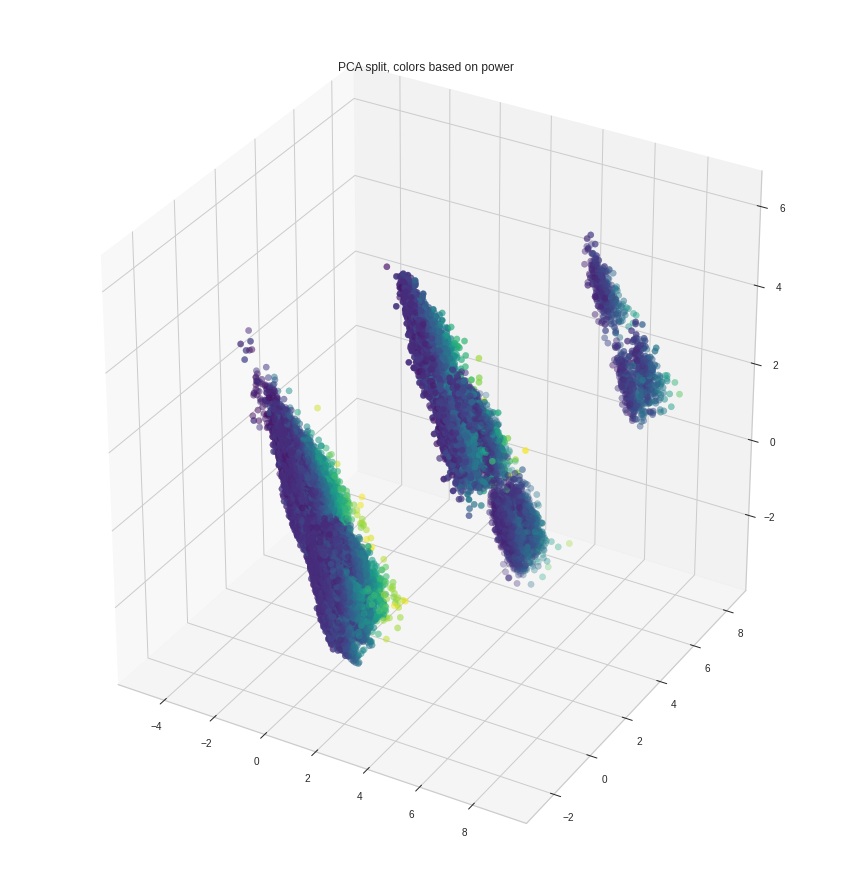

In [ ]:
# plot the data
x = features_pca3[:,0]
y = features_pca3[:,1]
z = features_pca3[:,2]

# creating figure
fig = pyplot.figure(figsize = (15, 16))
ax = pyplot.axes(projection ="3d")

ax.scatter(x, y, z, c = features[:,11], s=40, marker='o', cmap = 'viridis')
ax.set_title("PCA split, colors based on power")
pyplot.show()

The clouds in the data are the result of categorical features in our input data. `PCA` and other dimension reduction techniques are built for continuous data and although they can be applied to categorical features, the result will never be continuous.

## 5.3 - K-means <a name="five-three"></a>

We apply K-means to cluster our PCA-transformed data. Let's immediately search for the ideal number of clusters using the Elbow method.

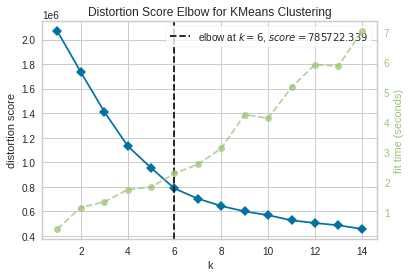

In [ ]:
visualizer = KElbowVisualizer(KMeans(), k=(1, 15))
visualizer.fit(features_pca)
visualizer.show()

We now fit the model with the selected ideal number of clusters.

In [ ]:
km = KMeans(n_clusters = 6) 
km.fit(features_pca)

KMeans(n_clusters=6)

To inspect the contents of these clusters, we compute the average value of the (original) covariates in each cluster

In [ ]:
avg_value_cluster = np.zeros(shape = (6, 14));
for idx in range(0, 6):
    avg_value_cluster[idx, :] = features[km.labels_ == idx, :].mean(axis = 0)

In [ ]:
label

array(['FO', 'PO', 'TPL', 'diesel', 'gasoline', 'private', 'work', 'N',
       'Y', 'bm', 'agec', 'power', 'long', 'lat'], dtype=object)

In [ ]:
avg_value_cluster[:, :3]

array([[-0.39444149, -0.62629479,  0.84509325],
       [ 2.52659442, -0.62629479, -1.1819928 ],
       [-0.39578968,  1.59669219, -1.1819928 ],
       [-0.39334353,  0.1371265 ,  0.14786528],
       [ 0.42433256, -0.01126525, -0.28419317],
       [ 0.36659596,  0.18147789, -0.41996494]])

Cluster 4 focuses on full omnium insured cars, let's look at the other features of this cluster

In [ ]:
label

array(['FO', 'PO', 'TPL', 'diesel', 'gasoline', 'private', 'work', 'N',
       'Y', 'bm', 'agec', 'power', 'long', 'lat'], dtype=object)

In [ ]:
avg_value_cluster[4, :]

array([ 0.42433256, -0.01126525, -0.28419317,  0.30373573, -0.30373573,
       -4.44040798,  4.44040798,  0.18087406, -0.18087406,  0.14351713,
       -0.26293075,  0.54654661, -0.0638754 ,  0.03901947])

## 5.4 - Hierarchical clustering <a name="five-four"></a>

Again, we have to take a subset of our data since the full data set would consume to much memory to cluster on the free Google Colab instance. For visualizing the methods we focus on the 3 dimensional PCA. In practice, the 6 component PCA is advised.

In [ ]:
sample = np.random.choice(features_pca3.shape[0], size=int(0.1*features_pca3.shape[0]), replace=False)
features_sample = features_pca3[sample,:]

In [ ]:
agglom = AgglomerativeClustering(n_clusters=5, linkage='average').fit(features_sample)

In [ ]:
# plot the data
x = features_sample[:,0]
y = features_sample[:,1]
z = features_sample[:,2]
color = agglom.labels_

# creating figure
fig = px.scatter_3d(x = x, y = y, z = z, color = color)
fig.show()

In [ ]:
agglom_single = AgglomerativeClustering(n_clusters=5, linkage='single').fit(features_sample)

In [ ]:
# plot the data
x = features_sample[:,0]
y = features_sample[:,1]
z = features_sample[:,2]
color = agglom_single.labels_

# creating figure
fig = px.scatter_3d(x = x, y = y, z = z, color = color)
fig.show()

In [ ]:
agglom_complete = AgglomerativeClustering(n_clusters=5, linkage='complete').fit(features_sample)

In [ ]:
# plot the data
x = features_sample[:,0]
y = features_sample[:,1]
z = features_sample[:,2]
color = agglom_complete.labels_

# creating figure
fig = px.scatter_3d(x = x, y = y, z = z, color = color)
fig.show()

In this example `linkage = single` corresponds to what we visually expect from a clustering algorithm as observations that are close to each other are clustered together. However, if we would increase the cluster count we would again end up with clusters containing a single observation.

In [ ]:
agglom_single = AgglomerativeClustering(n_clusters=15, linkage='single').fit(features_sample)

# plot the data
x = features_sample[:,0]
y = features_sample[:,1]
z = features_sample[:,2]
color = agglom_single.labels_

# creating figure
fig = px.scatter_3d(x = x, y = y, z = z, color = color)
fig.show()